In [78]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import patches

In [79]:
df = pd.read_csv(r'../../results/computed-fuel-rates-oct2021-sep2022-test-10222023.csv', delimiter=',', skiprows=0, low_memory=False)

In [80]:
df.columns

Index(['Unnamed: 0.4', 'Unnamed: 0.3', 'Unnamed: 0.2', 'Unnamed: 0.1',
       'Unnamed: 0', 'ServiceDateTime', 'DateKey', 'CalendarDate', 'Year',
       'Month', 'OpKey', 'Operator', 'RtKey', 'RtKey2', 'Route', 'RouteName',
       'TripKey', 'Trip', 'StopKey', 'Stop', 'StopName', 'Vehicle',
       'VehicleType', 'SeatedCap', 'TotalCap', 'Lat', 'Lon', 'Boards',
       'Alights', 'Onboard', 'Bike', 'Daytype', 'Hour', 'Minute', 'Second',
       'Date', 'Powertrain', 'VehicleModel', 'Vehicle_mass',
       'time_delta_in_seconds', 'dist', 'Speed', 'Acceleration', 'elevation',
       'grade', 'Energy'],
      dtype='object')

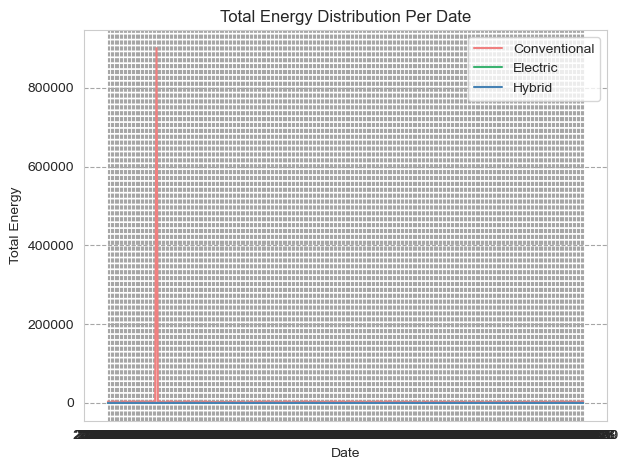

In [81]:
# Step 1: Aggregate the Energy based on Date and Powertrain
df_all_gal=df.copy()

# Conditionally modify Energy values based on Powertrain column
df_all_gal.loc[df_all_gal['Powertrain'] == 'electric', 'Energy'] = df_all_gal['Energy'] / 33.7
df_all_gal = df_all_gal.groupby(['Date', 'Powertrain'])['Energy'].sum().unstack().fillna(0)

# Step 2: Plot a time series line chart
color_label_map = {'conventional': ('lightcoral', 'Conventional'), 'hybrid': ('steelblue', 'Hybrid'), 'electric': ('mediumseagreen', 'Electric')}
colors = [color_label_map[powertrain][0] for powertrain in df_all_gal.columns]
labels = [color_label_map[powertrain][1] for powertrain in df_all_gal.columns]

for column, color, label in zip(df_all_gal.columns, colors, labels):
    plt.plot(df_all_gal.index, df_all_gal[column], color=color, label=label)

# Step 3: Format the plot
plt.title('Total Energy Distribution Per Date')
plt.xlabel('Date')
plt.ylabel('Total Energy')
plt.legend()
plt.tight_layout()
plt.grid(True, which="both", ls="--", c='0.65')
plt.show()


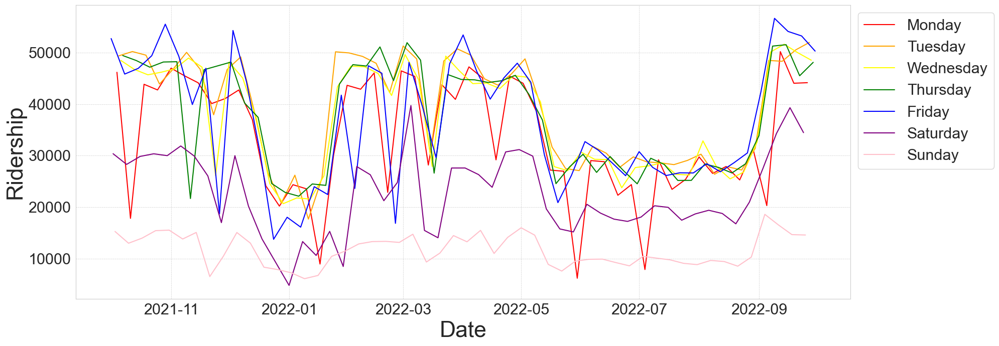

In [82]:
# Convert ServiceDateTime to datetime format
df['ServiceDateTime'] = pd.to_datetime(df['ServiceDateTime'])

# Create a new column for the day of the week
df['DayOfWeek'] = df['ServiceDateTime'].dt.day_name()

# Aggregate data by ServiceDateTime and DayOfWeek
daily_ridership = df.groupby([df['ServiceDateTime'].dt.date, 'DayOfWeek']).agg({'Boards': 'sum', 'Alights': 'sum'}).reset_index()
daily_ridership['TotalRidership'] = daily_ridership['Boards'] + daily_ridership['Alights']

# Define colors for each day of the week
colors = {
    'Monday': 'red',
    'Tuesday': 'orange',
    'Wednesday': 'yellow',
    'Thursday': 'green',
    'Friday': 'blue',
    'Saturday': 'purple',
    'Sunday': 'pink'
}

# Plotting
plt.figure(figsize=(20, 7))
for day, color in colors.items():
    subset = daily_ridership[daily_ridership['DayOfWeek'] == day]
    plt.plot(subset['ServiceDateTime'], subset['TotalRidership'], label=day, color=color)

#plt.title('Ridership Timeseries by Day of Week')
plt.xlabel('Date', fontsize=32)
plt.ylabel('Ridership', fontsize=32)
plt.xticks(fontsize=22)
plt.yticks(fontsize=22)
plt.legend(loc="upper left", bbox_to_anchor=(1, 1), fontsize=22)


plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


In [83]:
df.loc[df['Powertrain'] == 'conventional', 'VehicleModel'].mode()

0    NEW FLYER XD40
Name: VehicleModel, dtype: object

In [84]:
df.loc[df['Powertrain'] == 'conventional', 'Vehicle_mass'].mode()

0    28250
Name: Vehicle_mass, dtype: int64

In [85]:
df_validation_heb = pd.read_csv(r'../../results/validation-vs-computed-fuel-rates-heb-oct2021-sep2022.csv', delimiter=',', skiprows=0, low_memory=False)

In [86]:
df_validation_cdb = pd.read_csv(r'../../results/validation-vs-computed-fuel-rates-cdb-oct2021-sep2022.csv', delimiter=',', skiprows=0, low_memory=False)

In [87]:
df.columns

Index(['Unnamed: 0.4', 'Unnamed: 0.3', 'Unnamed: 0.2', 'Unnamed: 0.1',
       'Unnamed: 0', 'ServiceDateTime', 'DateKey', 'CalendarDate', 'Year',
       'Month', 'OpKey', 'Operator', 'RtKey', 'RtKey2', 'Route', 'RouteName',
       'TripKey', 'Trip', 'StopKey', 'Stop', 'StopName', 'Vehicle',
       'VehicleType', 'SeatedCap', 'TotalCap', 'Lat', 'Lon', 'Boards',
       'Alights', 'Onboard', 'Bike', 'Daytype', 'Hour', 'Minute', 'Second',
       'Date', 'Powertrain', 'VehicleModel', 'Vehicle_mass',
       'time_delta_in_seconds', 'dist', 'Speed', 'Acceleration', 'elevation',
       'grade', 'Energy', 'DayOfWeek'],
      dtype='object')

In [88]:
df['Route'].unique()

array(['R44', '39E', '9999', '(X) 39E', 'B48', '801', '806', 'B6', 'R14',
       'X92', 'G73', 'X90', '821', '820', 'P11', '804', '805', '824',
       '823', '802', '892', '803', 'R24', '(X) P11', 'B17', 'R10', 'G3',
       'B4', 'B7', 'R29', 'B23', 'P20', 'G5', '(X) 821', '(X) 804',
       '(X) 892', '(X) 823', '(X) 801', '(X) 820', '(X) 802', 'G1', 'B12',
       'G2', '921', '(X) 805', '(X) 824', '(X) 803', 'P21', '(X) 902',
       '(X) 806', '890', 'B9', '(X) B9', 'R42', 'R41', 'B79', '38', '30',
       '31', '33', '46', '45', '(X) 38', '36', '35', '34', '(X) 34',
       'B43', '943', '(X) 943'], dtype=object)

In [89]:
# replace all occurrences of '(X)' with an empty string
df['Route'] = df['Route'].str.replace(r'\(X\)|\(\)', '', regex=True)

In [90]:
df['Route'].unique()

array(['R44', '39E', '9999', ' 39E', 'B48', '801', '806', 'B6', 'R14',
       'X92', 'G73', 'X90', '821', '820', 'P11', '804', '805', '824',
       '823', '802', '892', '803', 'R24', ' P11', 'B17', 'R10', 'G3',
       'B4', 'B7', 'R29', 'B23', 'P20', 'G5', ' 821', ' 804', ' 892',
       ' 823', ' 801', ' 820', ' 802', 'G1', 'B12', 'G2', '921', ' 805',
       ' 824', ' 803', 'P21', ' 902', ' 806', '890', 'B9', ' B9', 'R42',
       'R41', 'B79', '38', '30', '31', '33', '46', '45', ' 38', '36',
       '35', '34', ' 34', 'B43', '943', ' 943'], dtype=object)

In [91]:
df['Route'] = df['Route'].str.lstrip()

In [92]:
df['Route'].unique()

array(['R44', '39E', '9999', 'B48', '801', '806', 'B6', 'R14', 'X92',
       'G73', 'X90', '821', '820', 'P11', '804', '805', '824', '823',
       '802', '892', '803', 'R24', 'B17', 'R10', 'G3', 'B4', 'B7', 'R29',
       'B23', 'P20', 'G5', 'G1', 'B12', 'G2', '921', 'P21', '902', '890',
       'B9', 'R42', 'R41', 'B79', '38', '30', '31', '33', '46', '45',
       '36', '35', '34', 'B43', '943'], dtype=object)

In [93]:
df_diesel=df.loc[df['Powertrain']!='electric']
df_diesel_sum = df_diesel.groupby(['Powertrain', 'Date', 'Route'])['Energy'].sum()
df_diesel_sum=df_diesel_sum.reset_index()
df_diesel_mean = df_diesel_sum.groupby(['Powertrain', 'Route'])['Energy'].mean()

In [94]:
df_diesel_mean

Powertrain    Route
conventional  30         82.552705
              31       2604.448276
              33         55.808709
              34         62.351558
              35         67.338592
                          ...     
hybrid        R14         7.903741
              R29         7.787502
              R44         7.088296
              X90        16.716543
              X92         6.891107
Name: Energy, Length: 93, dtype: float64

In [95]:
# Convert the Series to a DataFrame
df_diesel_mean = pd.DataFrame(df_diesel_mean)
df_diesel_mean=df_diesel_mean.reset_index()
df_diesel_mean

,Powertrain,Route,Energy
0,conventional,30,82.552705
1,conventional,31,2604.448276
2,conventional,33,55.808709
3,conventional,34,62.351558
4,conventional,35,67.338592
...,...,...,...
88,hybrid,R14,7.903741
89,hybrid,R29,7.787502
90,hybrid,R44,7.088296
91,hybrid,X90,16.716543


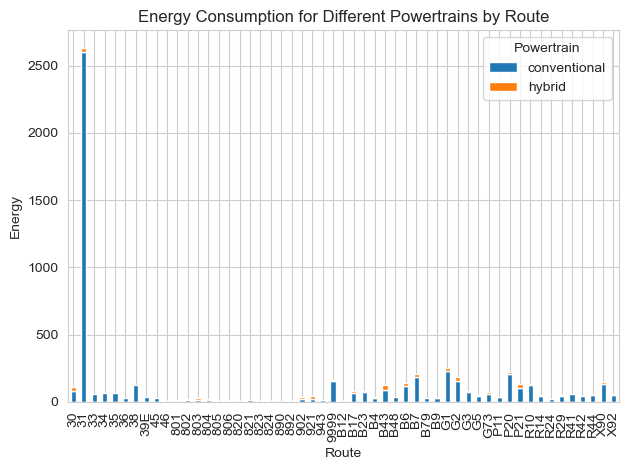

In [96]:
df_pivot = df_diesel_mean.pivot(index='Route', columns='Powertrain', values='Energy')

df_pivot.plot(kind='bar', stacked=True)

plt.ylabel('Energy')
plt.title('Energy Consumption for Different Powertrains by Route')
plt.tight_layout()
plt.show()


In [97]:
df_electric=df.loc[df['Powertrain']=='electric']
df_electric_sum = df_electric.groupby(['Powertrain', 'Date', 'Route'])['Energy'].sum()
df_electric_sum=df_electric_sum.reset_index()
df_electric_mean = df_electric_sum.groupby(['Powertrain', 'Route'])['Energy'].mean()

In [98]:
df_electric_mean

Powertrain  Route
electric    30       125.493316
            31        83.714686
            33       143.001416
            36        49.691242
            45       115.550299
            46        12.152054
            801       12.919767
            802       18.886205
            803       14.730869
            804       12.998970
            805       10.417705
            806        4.816415
            820       14.509984
            821       15.094050
            823        6.593386
            824        5.276775
            890        4.786781
            892       20.621050
            902       43.294207
            921       67.035245
            943       12.239483
            9999      29.557450
            B12       13.187674
            B17      200.987674
            B23       78.876840
            B4        76.356079
            B43       82.789791
            B48       67.329211
            B6       164.428665
            B7       169.395633
            G1       2

In [99]:
# convert gallons of diesel to kwh
df_gal = df.copy()
# Devide Energy by 33.7 where Powertrain is 'conventional' or 'hybrid'
df_gal.loc[df_gal['Powertrain'].isin(['electric']), 'Energy'] = df_gal['Energy'] / 33.7

In [100]:
# convert gallons of diesel to kwh
df_kwh = df.copy()
# multiply Energy by 33.7 where Powertrain is 'conventional' or 'hybrid'
df_kwh.loc[df_kwh['Powertrain'].isin(['conventional', 'hybrid']), 'Energy'] = df_kwh['Energy'] * 33.7

In [101]:
# Preparation for plotting
df_model_aggregated_routes = df_kwh.groupby(['Route','Date' ,'Hour']).agg({'Energy': ['sum'],'dist': ['sum'],'Onboard':['sum'],'Powertrain':['max'],'VehicleModel':['max']}).reset_index()
df_model_aggregated_routes.columns = df_model_aggregated_routes.columns.droplevel(1)
df_model_aggregated_routes['Date'] = pd.to_datetime(df_model_aggregated_routes['Date'])
df_model_aggregated_routes['Route'] = df_model_aggregated_routes['Route'].str.replace("X","")
df_model_aggregated_routes['Route'] = df_model_aggregated_routes['Route'].str.replace("(","")
df_model_aggregated_routes['Route'] = df_model_aggregated_routes['Route'].str.replace(")","")

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_28908\3933258828.py:6: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_model_aggregated_routes['Route'] = df_model_aggregated_routes['Route'].str.replace("(","")
C:\Users\Mahsa\AppData\Local\Temp\ipykernel_28908\3933258828.py:7: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_model_aggregated_routes['Route'] = df_model_aggregated_routes['Route'].str.replace(")","")


In [102]:
df_model_aggregated_routes = df_model_aggregated_routes.groupby(['Route','Hour']).agg({'Energy': ['mean'],'dist': ['mean'],'Onboard':['mean'],'Powertrain':['max'],'VehicleModel':['max']}).reset_index()
df_model_aggregated_routes.columns = df_model_aggregated_routes.columns.droplevel(1)
df_model_aggregated_routes['fuel_economy']=df_model_aggregated_routes['dist']/df_model_aggregated_routes['Energy']
df_model_aggregated_routes['energy_intensity']=df_model_aggregated_routes['Energy']/df_model_aggregated_routes['Onboard']

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_28908\1764107466.py:7: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  heatmap = sns.heatmap(df_model_aggregated_routes.pivot("Route", "Hour", "Energy"), cmap="YlOrRd")


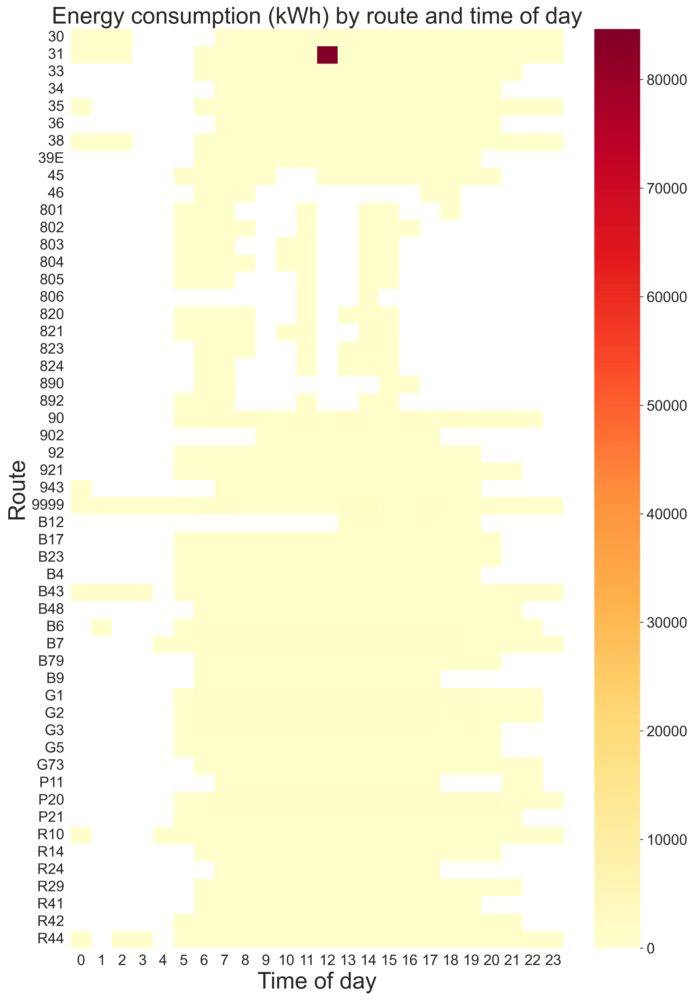

In [103]:
# Set the style of the plot
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(12, 18), dpi=400)


# Create the heatmap
heatmap = sns.heatmap(df_model_aggregated_routes.pivot("Route", "Hour", "Energy"), cmap="YlOrRd")
plt.ylabel('Route', fontsize=25)
plt.xlabel('Time of day', fontsize=25)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=16)
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)


# Set the title of the plot
plt.title("Energy consumption (kWh) by route and time of day", fontsize=25)

# Show the plot
plt.show()

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_28908\3640767148.py:10: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  heatmap =sns.heatmap(df_model_aggregated_routes.pivot("Route", "Hour", "fuel_economy"), cmap="YlOrRd")


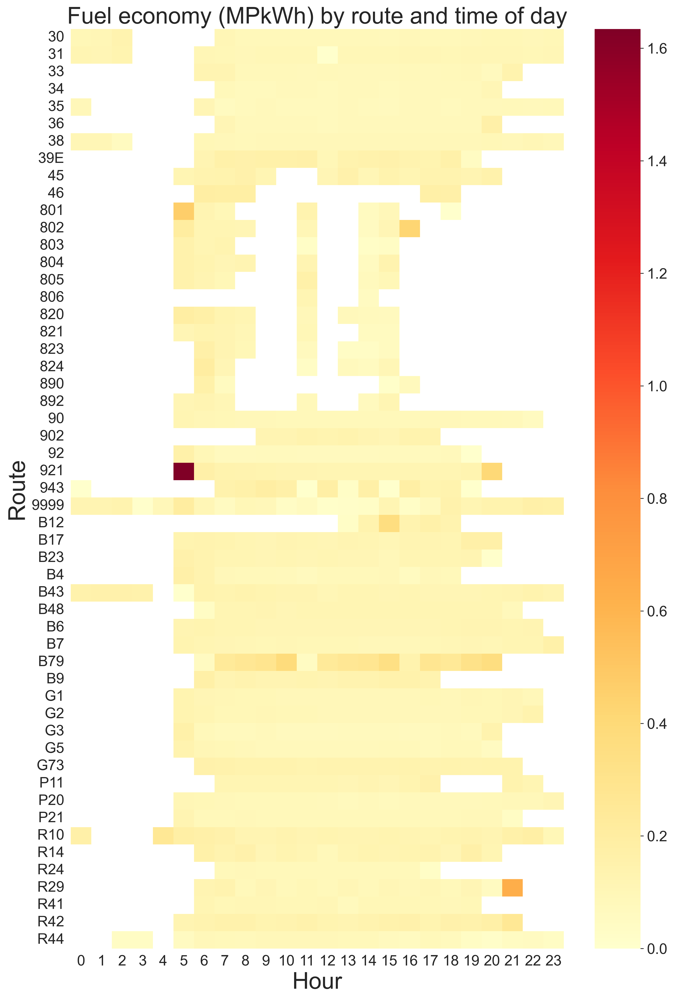

In [104]:
# Set the style of the plot
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(12, 18), dpi=400)
plt.ylabel('Route', fontsize=25)
plt.xlabel('Time of day', fontsize=25)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Create the heatmap
heatmap =sns.heatmap(df_model_aggregated_routes.pivot("Route", "Hour", "fuel_economy"), cmap="YlOrRd")

# Set the title of the plot
plt.title("Fuel economy (MPkWh) by route and time of day", fontsize=25)

cbar = heatmap.collections[0].colorbar
cbar.ax.tick_params(labelsize=16)

# Show the plot
plt.show()

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_28908\2816409389.py:7: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  heatmap = sns.heatmap(df_model_aggregated_routes.pivot("Route", "Hour", "energy_intensity"), cmap="YlOrRd")


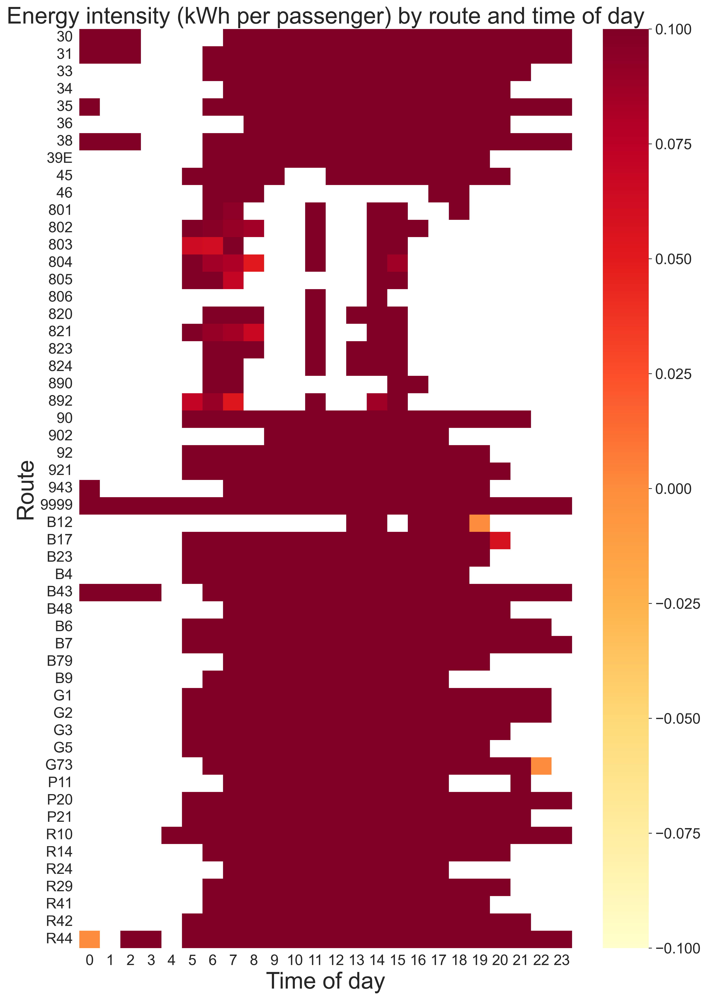

In [105]:
# Set the style of the plot
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(12, 18), dpi=400)


# Create the heatmap
heatmap = sns.heatmap(df_model_aggregated_routes.pivot("Route", "Hour", "energy_intensity"), cmap="YlOrRd")
plt.ylabel('Route', fontsize=25)
plt.xlabel('Time of day', fontsize=25)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=16)
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)


# Set the title of the plot
plt.title("Energy intensity (kWh per passenger) by route and time of day", fontsize=25)

# Show the plot
plt.show()

In [106]:
df_model_aggregated_routes.columns

Index(['Route', 'Hour', 'Energy', 'dist', 'Onboard', 'Powertrain',
       'VehicleModel', 'fuel_economy', 'energy_intensity'],
      dtype='object')

In [107]:
# Preparation for monthly plotting
df_model_aggregated_routes_daily = df_kwh.groupby(['Route','Date']).agg({'Energy': ['sum'],'dist': ['sum'],'Onboard':['sum'],'Powertrain':['max'],'VehicleModel':['max']}).reset_index()
df_model_aggregated_routes_daily.columns = df_model_aggregated_routes_daily.columns.droplevel(1)
df_model_aggregated_routes_daily['Date'] = pd.to_datetime(df_model_aggregated_routes_daily['Date'])
df_model_aggregated_routes_daily['Route'] = df_model_aggregated_routes_daily['Route'].str.replace("X","")
df_model_aggregated_routes_daily['Route'] = df_model_aggregated_routes_daily['Route'].str.replace("(","")
df_model_aggregated_routes_daily['Route'] = df_model_aggregated_routes_daily['Route'].str.replace(")","")

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_28908\1829833832.py:6: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_model_aggregated_routes_daily['Route'] = df_model_aggregated_routes_daily['Route'].str.replace("(","")
C:\Users\Mahsa\AppData\Local\Temp\ipykernel_28908\1829833832.py:7: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_model_aggregated_routes_daily['Route'] = df_model_aggregated_routes_daily['Route'].str.replace(")","")


In [108]:
df_model_aggregated_routes_daily = df_model_aggregated_routes_daily.groupby(['Route','Date']).agg({'Energy': ['mean'],'dist': ['mean'],'Onboard':['mean'],'Powertrain':['max'],'VehicleModel':['max']}).reset_index()
df_model_aggregated_routes_daily.columns = df_model_aggregated_routes_daily.columns.droplevel(1)
df_model_aggregated_routes_daily['fuel_economy']=df_model_aggregated_routes_daily['dist']/df_model_aggregated_routes_daily['Energy']
df_model_aggregated_routes_daily['energy_intensity']=df_model_aggregated_routes_daily['Energy']/df_model_aggregated_routes_daily['Onboard']

In [109]:
# Remove one bad points for route 31
df_model_aggregated_routes_daily=df_model_aggregated_routes_daily.loc[df_model_aggregated_routes_daily['Energy']<1000]

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_28908\1705276135.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(mean_energy_sorted.index, rotation=90)


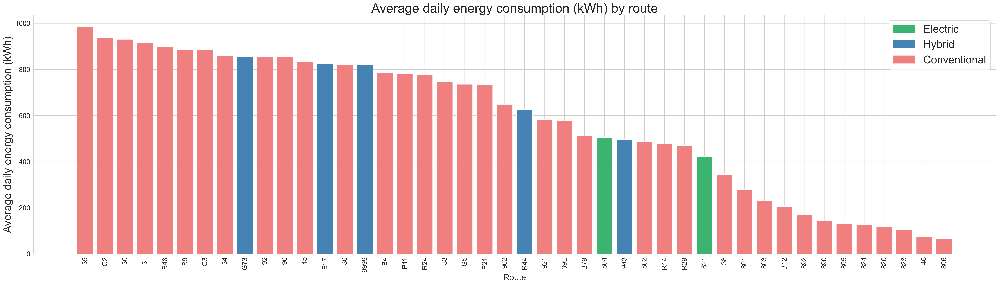

In [110]:
fig, ax = plt.subplots(figsize=(40, 10), dpi=400)
mean_energy = df_model_aggregated_routes_daily.groupby('Route')['Energy'].mean()
mean_energy_sorted = mean_energy.sort_values(ascending=False)
colors = []
labels = []
color_label_map = {'conventional': ('lightcoral', 'Conventional'), 'hybrid': ('steelblue', 'Hybrid'), 'electric': ('mediumseagreen', 'Electric')}

for route in mean_energy_sorted.index:
    # Find the most repeated VehicleModel for the current route
    most_repeated_vehicle_model = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['Route'] == route]['VehicleModel'].value_counts().idxmax()
    
    # Get the powertrain for the most repeated VehicleModel
    powertrain = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['VehicleModel'] == most_repeated_vehicle_model]['Powertrain'].iloc[0]
    
    color, label = color_label_map[powertrain]
    colors.append(color)
    labels.append(label)

ax.bar(mean_energy_sorted.index, mean_energy_sorted.values, color=colors)
ax.set_xticklabels(mean_energy_sorted.index, rotation=90)

# Create unique color patches and labels for legend
unique_colors_labels = list(set(zip(colors, labels)))
legend_patches = [patches.Patch(color=color, label=label) for color, label in unique_colors_labels]
ax.legend(handles=legend_patches, loc='upper right', fontsize=25)

ax.set_xlabel('Route', fontsize=20)
ax.set_ylabel('Average daily energy consumption (kWh)', fontsize=25)
ax.set_title('Average daily energy consumption (kWh) by route', fontsize=30)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_28908\3702788209.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(mean_fuel_economy_sorted.index, rotation=90)


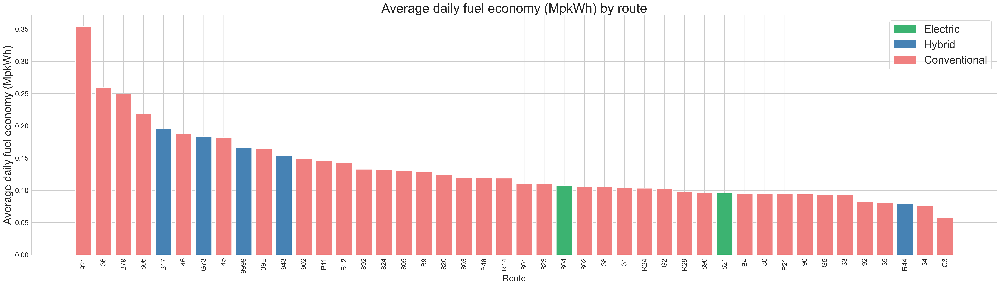

In [111]:
fig, ax = plt.subplots(figsize=(40, 10), dpi=400)
mean_fuel_economy = df_model_aggregated_routes_daily.groupby('Route')['fuel_economy'].mean()
mean_fuel_economy_sorted = mean_fuel_economy.sort_values(ascending=False)
colors = []
labels = []
color_label_map = {'conventional': ('lightcoral', 'Conventional'), 'hybrid': ('steelblue', 'Hybrid'), 'electric': ('mediumseagreen', 'Electric')}

for route in mean_fuel_economy_sorted.index:
    # Find the most repeated VehicleModel for the current route
    most_repeated_vehicle_model = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['Route'] == route]['VehicleModel'].value_counts().idxmax()
    
    # Get the powertrain for the most repeated VehicleModel
    powertrain = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['VehicleModel'] == most_repeated_vehicle_model]['Powertrain'].iloc[0]
    
    color, label = color_label_map[powertrain]
    colors.append(color)
    labels.append(label)

ax.bar(mean_fuel_economy_sorted.index, mean_fuel_economy_sorted.values, color=colors)
ax.set_xticklabels(mean_fuel_economy_sorted.index, rotation=90)

# Create unique color patches and labels for legend
unique_colors_labels = list(set(zip(colors, labels)))
legend_patches = [patches.Patch(color=color, label=label) for color, label in unique_colors_labels]
ax.legend(handles=legend_patches, loc='upper right', fontsize=25)

ax.set_xlabel('Route', fontsize=20)
ax.set_ylabel('Average daily fuel economy (MpkWh)', fontsize=25)
ax.set_title('Average daily fuel economy (MpkWh) by route', fontsize=30)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_28908\236952869.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(mean_energy_intensity_sorted.index, rotation=90)


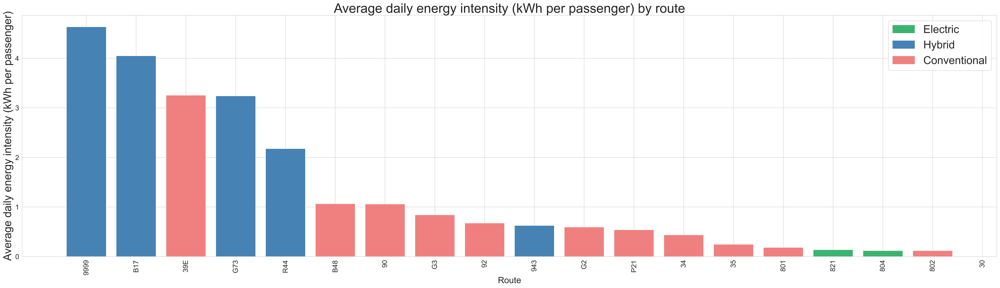

In [112]:
fig, ax = plt.subplots(figsize=(40, 10), dpi=400)
mean_energy_intensity = df_model_aggregated_routes_daily.groupby('Route')['energy_intensity'].mean()
mean_energy_intensity_sorted = mean_energy_intensity.sort_values(ascending=False)
colors = []
labels = []
color_label_map = {'conventional': ('lightcoral', 'Conventional'), 'hybrid': ('steelblue', 'Hybrid'), 'electric': ('mediumseagreen', 'Electric')}

for route in mean_energy_intensity_sorted.index:
    # Find the most repeated VehicleModel for the current route
    most_repeated_vehicle_model = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['Route'] == route]['VehicleModel'].value_counts().idxmax()
    
    # Get the powertrain for the most repeated VehicleModel
    powertrain = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['VehicleModel'] == most_repeated_vehicle_model]['Powertrain'].iloc[0]
    
    color, label = color_label_map[powertrain]
    colors.append(color)
    labels.append(label)

ax.bar(mean_energy_intensity_sorted.index, mean_energy_intensity_sorted.values, color=colors)
ax.set_xticklabels(mean_energy_intensity_sorted.index, rotation=90)

# Create unique color patches and labels for legend
unique_colors_labels = list(set(zip(colors, labels)))
legend_patches = [patches.Patch(color=color, label=label) for color, label in unique_colors_labels]
ax.legend(handles=legend_patches, loc='upper right', fontsize=25)

ax.set_xlabel('Route', fontsize=20)
ax.set_ylabel('Average daily energy intensity (kWh per passenger)', fontsize=25)
ax.set_title('Average daily energy intensity (kWh per passenger) by route', fontsize=30)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

In [113]:
# Preparation for plotting ****gal
df_model_aggregated_routes = df_gal.groupby(['Route','Date' ,'Hour']).agg({'Energy': ['sum'],'dist': ['sum'],'Onboard':['sum'],'Powertrain':['max'],'VehicleModel':['max']}).reset_index()
df_model_aggregated_routes.columns = df_model_aggregated_routes.columns.droplevel(1)
df_model_aggregated_routes['Date'] = pd.to_datetime(df_model_aggregated_routes['Date'])
df_model_aggregated_routes['Route'] = df_model_aggregated_routes['Route'].str.replace("X","")
df_model_aggregated_routes['Route'] = df_model_aggregated_routes['Route'].str.replace("(","")
df_model_aggregated_routes['Route'] = df_model_aggregated_routes['Route'].str.replace(")","")

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_28908\3975989120.py:6: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_model_aggregated_routes['Route'] = df_model_aggregated_routes['Route'].str.replace("(","")
C:\Users\Mahsa\AppData\Local\Temp\ipykernel_28908\3975989120.py:7: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_model_aggregated_routes['Route'] = df_model_aggregated_routes['Route'].str.replace(")","")


In [114]:
df_model_aggregated_routes = df_model_aggregated_routes.groupby(['Route','Hour']).agg({'Energy': ['mean'],'dist': ['mean'],'Onboard':['mean'],'Powertrain':['max'],'VehicleModel':['max']}).reset_index()
df_model_aggregated_routes.columns = df_model_aggregated_routes.columns.droplevel(1)
df_model_aggregated_routes['fuel_economy']=df_model_aggregated_routes['dist']/df_model_aggregated_routes['Energy']
df_model_aggregated_routes['energy_intensity']=df_model_aggregated_routes['Energy']/df_model_aggregated_routes['Onboard']

In [115]:
# Preparation for monthly plotting
df_model_aggregated_routes_daily = df_kwh.groupby(['Route','Date']).agg({'Energy': ['sum'],'dist': ['sum'],'Onboard':['sum'],'Powertrain':['max'],'VehicleModel':['max']}).reset_index()
df_model_aggregated_routes_daily.columns = df_model_aggregated_routes_daily.columns.droplevel(1)
df_model_aggregated_routes_daily['Date'] = pd.to_datetime(df_model_aggregated_routes_daily['Date'])
df_model_aggregated_routes_daily['Route'] = df_model_aggregated_routes_daily['Route'].str.replace("X","")
df_model_aggregated_routes_daily['Route'] = df_model_aggregated_routes_daily['Route'].str.replace("(","")
df_model_aggregated_routes_daily['Route'] = df_model_aggregated_routes_daily['Route'].str.replace(")","")

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_28908\1829833832.py:6: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_model_aggregated_routes_daily['Route'] = df_model_aggregated_routes_daily['Route'].str.replace("(","")
C:\Users\Mahsa\AppData\Local\Temp\ipykernel_28908\1829833832.py:7: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df_model_aggregated_routes_daily['Route'] = df_model_aggregated_routes_daily['Route'].str.replace(")","")


In [116]:
df_model_aggregated_routes_daily = df_model_aggregated_routes_daily.groupby(['Route','Date']).agg({'Energy': ['mean'],'dist': ['mean'],'Onboard':['mean'],'Powertrain':['max'],'VehicleModel':['max']}).reset_index()
df_model_aggregated_routes_daily.columns = df_model_aggregated_routes_daily.columns.droplevel(1)
df_model_aggregated_routes_daily['fuel_economy']=df_model_aggregated_routes_daily['dist']/df_model_aggregated_routes_daily['Energy']
df_model_aggregated_routes_daily['energy_intensity']=df_model_aggregated_routes_daily['Energy']/df_model_aggregated_routes_daily['Onboard']

In [117]:
# Remove one bad points for route 31
df_model_aggregated_routes_daily=df_model_aggregated_routes_daily.loc[df_model_aggregated_routes_daily['Energy']<1000]

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_28908\2047985534.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(mean_energy_sorted.index, rotation=90)


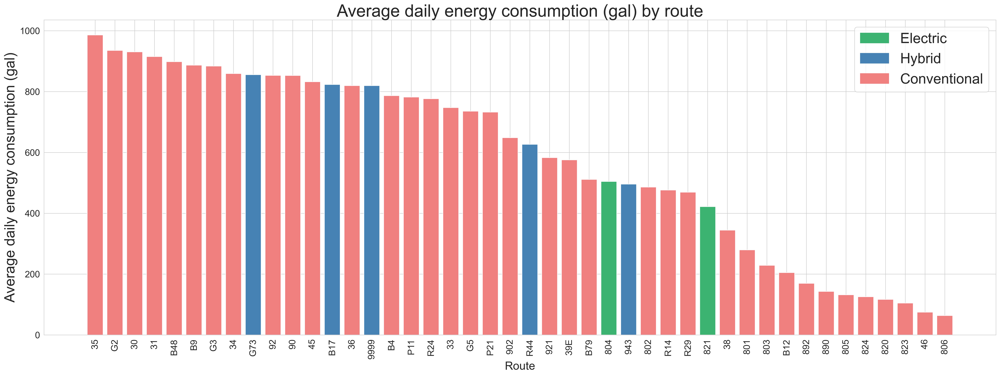

In [118]:
fig, ax = plt.subplots(figsize=(30, 10), dpi=400)
mean_energy = df_model_aggregated_routes_daily.groupby('Route')['Energy'].mean()
mean_energy_sorted = mean_energy.sort_values(ascending=False)
colors = []
labels = []
color_label_map = {'conventional': ('lightcoral', 'Conventional'), 'hybrid': ('steelblue', 'Hybrid'), 'electric': ('mediumseagreen', 'Electric')}

for route in mean_energy_sorted.index:
    # Find the most repeated VehicleModel for the current route
    most_repeated_vehicle_model = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['Route'] == route]['VehicleModel'].value_counts().idxmax()
    
    # Get the powertrain for the most repeated VehicleModel
    powertrain = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['VehicleModel'] == most_repeated_vehicle_model]['Powertrain'].iloc[0]
    
    color, label = color_label_map[powertrain]
    colors.append(color)
    labels.append(label)

ax.bar(mean_energy_sorted.index, mean_energy_sorted.values, color=colors)
ax.set_xticklabels(mean_energy_sorted.index, rotation=90)

# Create unique color patches and labels for legend
unique_colors_labels = list(set(zip(colors, labels)))
legend_patches = [patches.Patch(color=color, label=label) for color, label in unique_colors_labels]
ax.legend(handles=legend_patches, loc='upper right', fontsize=25)

ax.set_xlabel('Route', fontsize=20)
ax.set_ylabel('Average daily energy consumption (gal)', fontsize=25)
ax.set_title('Average daily energy consumption (gal) by route', fontsize=30)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_28908\4086797695.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(mean_fuel_economy_sorted.index, rotation=90)


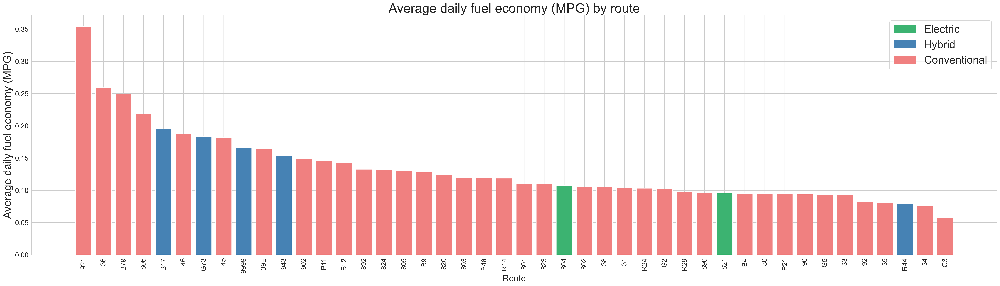

In [119]:
fig, ax = plt.subplots(figsize=(40, 10), dpi=400)
mean_fuel_economy = df_model_aggregated_routes_daily.groupby('Route')['fuel_economy'].mean()
mean_fuel_economy_sorted = mean_fuel_economy.sort_values(ascending=False)
colors = []
labels = []
color_label_map = {'conventional': ('lightcoral', 'Conventional'), 'hybrid': ('steelblue', 'Hybrid'), 'electric': ('mediumseagreen', 'Electric')}

for route in mean_fuel_economy_sorted.index:
    # Find the most repeated VehicleModel for the current route
    most_repeated_vehicle_model = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['Route'] == route]['VehicleModel'].value_counts().idxmax()
    
    # Get the powertrain for the most repeated VehicleModel
    powertrain = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['VehicleModel'] == most_repeated_vehicle_model]['Powertrain'].iloc[0]
    
    color, label = color_label_map[powertrain]
    colors.append(color)
    labels.append(label)

ax.bar(mean_fuel_economy_sorted.index, mean_fuel_economy_sorted.values, color=colors)
ax.set_xticklabels(mean_fuel_economy_sorted.index, rotation=90)

# Create unique color patches and labels for legend
unique_colors_labels = list(set(zip(colors, labels)))
legend_patches = [patches.Patch(color=color, label=label) for color, label in unique_colors_labels]
ax.legend(handles=legend_patches, loc='upper right', fontsize=25)

ax.set_xlabel('Route', fontsize=20)
ax.set_ylabel('Average daily fuel economy (MPG)', fontsize=25)
ax.set_title('Average daily fuel economy (MPG) by route', fontsize=30)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

C:\Users\Mahsa\AppData\Local\Temp\ipykernel_28908\140125491.py:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(mean_energy_intensity_sorted.index, rotation=90)


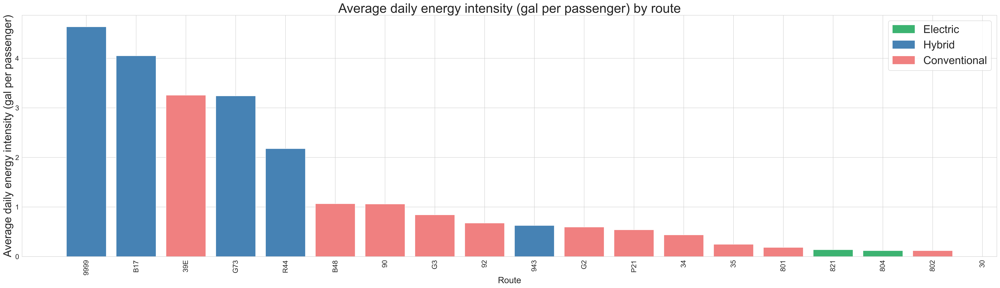

In [120]:
fig, ax = plt.subplots(figsize=(40, 10), dpi=400)
mean_energy_intensity = df_model_aggregated_routes_daily.groupby('Route')['energy_intensity'].mean()
mean_energy_intensity_sorted = mean_energy_intensity.sort_values(ascending=False)
colors = []
labels = []
color_label_map = {'conventional': ('lightcoral', 'Conventional'), 'hybrid': ('steelblue', 'Hybrid'), 'electric': ('mediumseagreen', 'Electric')}

for route in mean_energy_intensity_sorted.index:
    # Find the most repeated VehicleModel for the current route
    most_repeated_vehicle_model = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['Route'] == route]['VehicleModel'].value_counts().idxmax()
    
    # Get the powertrain for the most repeated VehicleModel
    powertrain = df_model_aggregated_routes_daily[df_model_aggregated_routes_daily['VehicleModel'] == most_repeated_vehicle_model]['Powertrain'].iloc[0]
    
    color, label = color_label_map[powertrain]
    colors.append(color)
    labels.append(label)

ax.bar(mean_energy_intensity_sorted.index, mean_energy_intensity_sorted.values, color=colors)
ax.set_xticklabels(mean_energy_intensity_sorted.index, rotation=90)

# Create unique color patches and labels for legend
unique_colors_labels = list(set(zip(colors, labels)))
legend_patches = [patches.Patch(color=color, label=label) for color, label in unique_colors_labels]
ax.legend(handles=legend_patches, loc='upper right', fontsize=25)

ax.set_xlabel('Route', fontsize=20)
ax.set_ylabel('Average daily energy intensity (gal per passenger)', fontsize=25)
ax.set_title('Average daily energy intensity (gal per passenger) by route', fontsize=30)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.show()

In [121]:
df_row_with_max_energy = df_kwh[df_kwh['Energy'] == df_kwh['Energy'].max()]
df_row_with_max_energy[['ServiceDateTime','Route','Powertrain','Stop', 'dist', 'Speed', 'Acceleration', 'Energy']]

,ServiceDateTime,Route,Powertrain,Stop,dist,Speed,Acceleration,Energy
14111566,2021-11-07 12:21:14,31,conventional,9,4.556807,6600.10601,284.713424,3.030761e+07


In [122]:
# Remove one bad points for route 31
df_kwh=df_kwh.loc[df_kwh['Energy']<1000]

In [123]:
# Create a pivot table
pivot_df = df_kwh.pivot_table(values='Energy', index='Route', columns='Powertrain', aggfunc='sum')

# Fill NaN values with 0
pivot_df = pivot_df.fillna(0)

# Sort the DataFrame by the sum of energies
pivot_df = pivot_df.loc[pivot_df.sum(axis=1).sort_values(ascending=False).index]
pivot_df = pivot_df[['conventional', 'hybrid', 'electric']]

In [124]:
# Drop the row where Route is 9999
pivot_df = pivot_df.drop('9999', axis=0)

In [125]:
pivot_df

Powertrain,conventional,hybrid,electric
Route,,,
G1,2.759708e+06,117068.129183,29319.774479
P20,2.498267e+06,90206.721727,10839.952436
B7,2.224880e+06,88497.576839,17786.541493
G2,1.920972e+06,86039.667126,7854.410804
X90,1.604055e+06,1690.042495,2274.968478
R10,1.517217e+06,6363.260251,5427.320861
B6,1.432280e+06,69846.448230,14140.865150
P21,1.260246e+06,61146.189080,1534.017213
B43,1.054618e+06,250372.428789,10679.883031


In [126]:
# Create the plot

fig, ax = plt.subplots(figsize=(40, 10), dpi=400)

pivot_df.plot(kind='bar', stacked=True, ax=ax, color=['lightcoral', 'steelblue', 'mediumseagreen'])

ax.set_xlabel('Route', fontsize=30)
ax.set_ylabel('Yearly energy consumption (kWh)', fontsize=35)
ax.set_title('Yearly energy consumption (kWh) by route and powertrain', fontsize=40)

plt.xticks(fontsize=32, rotation=45)
plt.yticks(fontsize=32)

# Create the legend
ax.legend(['Conventional', 'Hybrid', 'Electric'], loc='upper right', fontsize=35)

plt.show()


In [127]:
# Create a list of indices that match the condition
indices_to_drop = [index for index in pivot_df.index if str(index).startswith(('8', '9'))]

# Drop the rows from the dataframe
pivot_df_without_800 = pivot_df.drop(indices_to_drop)
pivot_df_without_800

Powertrain,conventional,hybrid,electric
Route,,,
G1,2.759708e+06,117068.129183,29319.774479
P20,2.498267e+06,90206.721727,10839.952436
B7,2.224880e+06,88497.576839,17786.541493
G2,1.920972e+06,86039.667126,7854.410804
X90,1.604055e+06,1690.042495,2274.968478
R10,1.517217e+06,6363.260251,5427.320861
B6,1.432280e+06,69846.448230,14140.865150
P21,1.260246e+06,61146.189080,1534.017213
B43,1.054618e+06,250372.428789,10679.883031


In [128]:
# Create the plot

fig, ax = plt.subplots(figsize=(40, 10), dpi=400)

pivot_df_without_800.plot(kind='bar', stacked=True, ax=ax, color=['lightcoral', 'steelblue', 'mediumseagreen'])

ax.set_xlabel('Route', fontsize=30)
ax.set_ylabel('Yearly energy consumption (kWh)', fontsize=35)
ax.set_title('Yearly energy consumption (kWh) by route and powertrain', fontsize=40)

plt.xticks(fontsize=32, rotation=45)
plt.yticks(fontsize=32)

# Create the legend
ax.legend(['Conventional', 'Hybrid', 'Electric'], loc='upper right', fontsize=35)

plt.show()


In [129]:
df_emissions = df_gal.copy()
df_emissions = df_emissions[df_emissions['Powertrain'] != 'electric']
df_emissions['emissions'] = df_emissions['Energy'] * 0.01086879 ### For each gallon of diesel burned, 9.86 kgCO$_2$e of greenhouse gas (GHG) emissions are produced.

In [130]:
df_row_with_max_energy = df_emissions[df_emissions['Energy'] == df_emissions['Energy'].max()]
df_row_with_max_energy[['ServiceDateTime','Route','Powertrain','Stop', 'dist', 'Speed', 'Acceleration', 'Energy', 'emissions']]

,ServiceDateTime,Route,Powertrain,Stop,dist,Speed,Acceleration,Energy,emissions
14111566,2021-11-07 12:21:14,31,conventional,9,4.556807,6600.10601,284.713424,899335.672905,9774.690568


In [131]:
df_emissions.loc[df_emissions['Energy']>1000]

,Unnamed: 0.4,Unnamed: 0.3,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,ServiceDateTime,DateKey,CalendarDate,Year,Month,...,Vehicle_mass,time_delta_in_seconds,dist,Speed,Acceleration,elevation,grade,Energy,DayOfWeek,emissions
14111566,14111566,14111566,3130690,3130690,3130690,2021-11-07 12:21:14,8615,2021-11-07 00:00:00.000,2021,11,...,28250,4,4.556807,6600.10601,284.713424,42.0,-0.007224,899335.672905,Sunday,9774.690568


In [132]:
# Remove one bad points for route 31
df_emissions=df_emissions.loc[df_emissions['Energy']<1000]

In [133]:
# Create a pivot table
pivot_df_emissions = df_emissions.pivot_table(values='emissions', index='Route', columns='Powertrain', aggfunc='sum')

# Drop the row where Route is 9999
#pivot_df = pivot_df.drop('9999', axis=0)

# Fill NaN values with 0
pivot_df_emissions = pivot_df_emissions.fillna(0)

# Sort the DataFrame by the sum of energies
pivot_df_emissions = pivot_df_emissions.loc[pivot_df_emissions.sum(axis=1).sort_values(ascending=False).index]

# Drop the row where Route is 9999
pivot_df_emissions = pivot_df_emissions.drop('9999', axis=0)

In [134]:
pivot_df_emissions

Powertrain,conventional,hybrid
Route,,
G1,890.049986,37.756348
P20,805.731276,29.093113
B7,717.559401,28.541887
G2,619.544262,27.749171
X90,517.333507,0.545066
R10,489.326819,2.052253
B6,461.933340,23.307365
P21,406.449483,19.720626
B43,340.131188,80.749120


In [135]:
# Create a list of indices that match the condition
indices_to_drop = [index for index in pivot_df.index if str(index).startswith(('8', '9'))]

# Drop the rows from the dataframe
pivot_df_emissions_without_800 = pivot_df_emissions.drop(indices_to_drop)
pivot_df_emissions_without_800

Powertrain,conventional,hybrid
Route,,
G1,890.049986,37.756348
P20,805.731276,29.093113
B7,717.559401,28.541887
G2,619.544262,27.749171
X90,517.333507,0.545066
R10,489.326819,2.052253
B6,461.933340,23.307365
P21,406.449483,19.720626
B43,340.131188,80.749120


In [136]:
# Create the plot

fig, ax = plt.subplots(figsize=(40, 10), dpi=400)

pivot_df_emissions.plot(kind='bar', stacked=True, ax=ax, color=['lightcoral', 'steelblue', 'mediumseagreen'])

ax.set_xlabel('Route', fontsize=30)
ax.set_ylabel('Yearly emissions (tCO2e)', fontsize=35)
ax.set_title('Yearly emissions (tCO2e) by route and powertrain', fontsize=40)

plt.xticks(fontsize=32, rotation=45)
plt.yticks(fontsize=32)

# Create the legend
ax.legend(['Conventional', 'Hybrid', 'Electric'], loc='upper right', fontsize=35)

plt.show()


In [137]:
# Create the plot

fig, ax = plt.subplots(figsize=(40, 10), dpi=400)

pivot_df_emissions_without_800.plot(kind='bar', stacked=True, ax=ax, color=['lightcoral', 'steelblue', 'mediumseagreen'])

ax.set_xlabel('Route', fontsize=30)
ax.set_ylabel('Yearly emissions (tCO2e)', fontsize=35)
ax.set_title('Yearly emissions (tCO2e) by route and powertrain', fontsize=40)

plt.xticks(fontsize=32, rotation=45)
plt.yticks(fontsize=32)

# Create the legend
ax.legend(['Conventional', 'Hybrid', 'Electric'], loc='upper right', fontsize=35)

plt.show()


In [138]:
df_emissions_daily = df_emissions.groupby(['Route']).agg({
    'Energy': 'sum',
    'emissions': 'sum',
    'Onboard': 'sum',
    'dist': 'sum',
    'Powertrain': lambda x: x.mode()[0] if not x.mode().empty else None
}).reset_index()

In [139]:
df_emissions_daily['emissions-per-passanger']=df_emissions_daily['emissions']/df_emissions_daily['Onboard']
df_emissions_daily['emissions-per-mile']=df_emissions_daily['emissions']/df_emissions_daily['dist']

In [140]:
# Create a pivot table
pivot_df_emissions = df_emissions_daily.pivot_table(values='emissions-per-passanger', index='Route', columns='Powertrain', aggfunc='sum')

# Fill NaN values with 0
pivot_df_emissions = pivot_df_emissions.fillna(0)

# Sort the DataFrame by the sum of energies
pivot_df_emissions = pivot_df_emissions.loc[pivot_df_emissions.sum(axis=1).sort_values(ascending=False).index]

# Drop the row where Route is 9999
pivot_df_emissions = pivot_df_emissions.drop('9999', axis=0)

In [141]:
# Create a list of indices that match the condition
indices_to_drop = [index for index in pivot_df.index if str(index).startswith(('8', '9'))]

# Drop the rows from the dataframe
pivot_df_emissions_without_800 = pivot_df_emissions.drop(indices_to_drop)
pivot_df_emissions_without_800

Powertrain,conventional
Route,
B79,0.008063
B9,0.000810
B12,0.000723
36,0.000424
R44,0.000420
39E,0.000387
46,0.000379
G73,0.000346
P11,0.000338


In [142]:
# Create the plot

fig, ax = plt.subplots(figsize=(40, 10), dpi=400)

pivot_df_emissions.plot(kind='bar', stacked=True, legend=False, ax=ax, color=['lightcoral', 'steelblue', 'mediumseagreen'])

ax.set_xlabel('Route', fontsize=30)
ax.set_ylabel('Yearly emissions per passanger (tCO2e)', fontsize=35)
ax.set_title('Yearly emissions per passanger (tCO2e) by route', fontsize=40)

plt.xticks(fontsize=32, rotation=45)
plt.yticks(fontsize=32)

# Create the legend
#ax.legend(['Conventional', 'Hybrid', 'Electric'], loc='upper right', fontsize=35)

plt.show()


In [143]:
# Create the plot

fig, ax = plt.subplots(figsize=(40, 10), dpi=400)

pivot_df_emissions_without_800.plot(kind='bar', stacked=True, legend=False, ax=ax, color=['lightcoral', 'steelblue', 'mediumseagreen'])

ax.set_xlabel('Route', fontsize=30)
ax.set_ylabel('Yearly emissions per passanger (tCO2e)', fontsize=35)
ax.set_title('Yearly emissions per passanger (tCO2e) by route', fontsize=40)

plt.xticks(fontsize=32, rotation=45)
plt.yticks(fontsize=32)

# Create the legend
#ax.legend(['Conventional', 'Hybrid', 'Electric'], loc='upper right', fontsize=35)

plt.show()


In [144]:
# Create a pivot table
pivot_df_emissions = df_emissions_daily.pivot_table(values='emissions-per-mile', index='Route', columns='Powertrain', aggfunc='sum')

# Fill NaN values with 0
pivot_df_emissions = pivot_df_emissions.fillna(0)

# Sort the DataFrame by the sum of energies
pivot_df_emissions = pivot_df_emissions.loc[pivot_df_emissions.sum(axis=1).sort_values(ascending=False).index]

# Drop the row where Route is 9999
pivot_df_emissions = pivot_df_emissions.drop('9999', axis=0)

In [145]:
# Create a list of indices that match the condition
indices_to_drop = [index for index in pivot_df.index if str(index).startswith(('8', '9'))]

# Drop the rows from the dataframe
pivot_df_emissions_without_800 = pivot_df_emissions.drop(indices_to_drop)
pivot_df_emissions_without_800

Powertrain,conventional
Route,
36,0.004682
X92,0.004531
G3,0.004500
35,0.004231
34,0.004131
P20,0.004060
B4,0.003979
G5,0.003945
R44,0.003932


In [146]:
# Create the plot

fig, ax = plt.subplots(figsize=(40, 10), dpi=400)

pivot_df_emissions.plot(kind='bar', stacked=True, legend=False, ax=ax, color=['lightcoral', 'steelblue', 'mediumseagreen'])

ax.set_xlabel('Route', fontsize=30)
ax.set_ylabel('Yearly emissions (tCO2e) \n per mile traveled', fontsize=35)
ax.set_title('Yearly emissions (tCO2e) per mile traveled by route', fontsize=40)

plt.xticks(fontsize=32, rotation=45) 

plt.yticks(fontsize=32)

# Create the legend
#ax.legend(['Conventional', 'Hybrid', 'Electric'], loc='upper right', fontsize=35)

plt.show()


In [147]:
# Create the plot

fig, ax = plt.subplots(figsize=(40, 10), dpi=400)

pivot_df_emissions_without_800.plot(kind='bar', stacked=True, legend=False, ax=ax, color=['lightcoral', 'steelblue', 'mediumseagreen'])

ax.set_xlabel('Route', fontsize=30)
ax.set_ylabel('Yearly emissions (tCO2e) \n per mile traveled', fontsize=35)
ax.set_title('Yearly emissions (tCO2e) per mile traveled by route', fontsize=40)

plt.xticks(fontsize=32, rotation=45)
plt.yticks(fontsize=32)

# Create the legend
#ax.legend(['Conventional', 'Hybrid', 'Electric'], loc='upper right', fontsize=35)

plt.show()


In [140]:
unique_trip_counts_per_day = df.groupby('Date')['TripKey'].nunique()

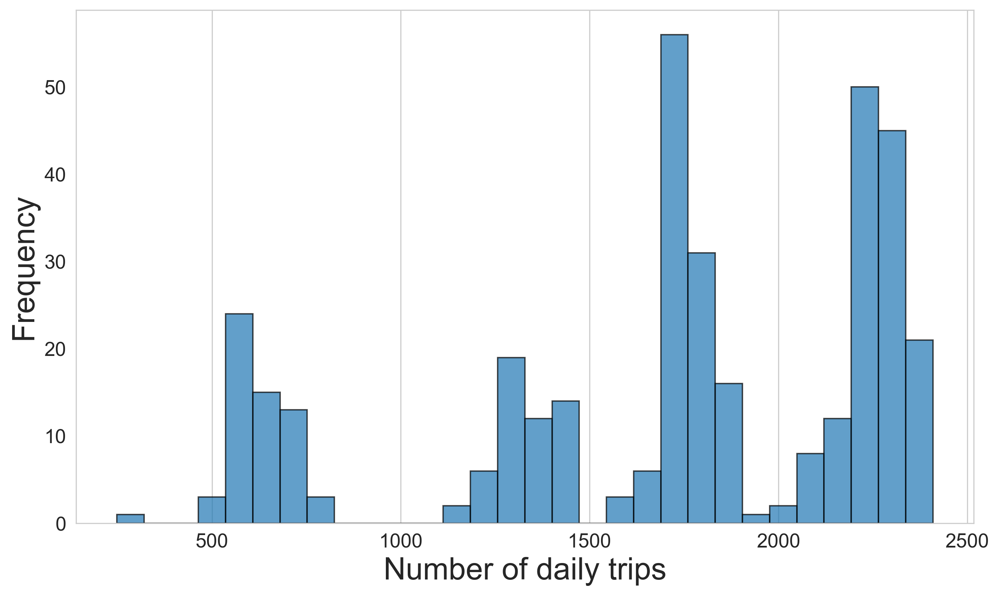

In [141]:
# Using matplotlib
plt.figure(figsize=(10, 6), dpi=300)

# Plotting the histogram
plt.hist(unique_trip_counts_per_day, bins=30, edgecolor='black', alpha=0.7)

# Setting labels, title, and adjusting their font sizes
plt.xlabel('Number of daily trips', fontsize=22)
plt.ylabel('Frequency', fontsize=22)

# Adjusting tick font sizes
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Displaying the grid and the plot
plt.grid(axis='y')
plt.tight_layout()
plt.show()


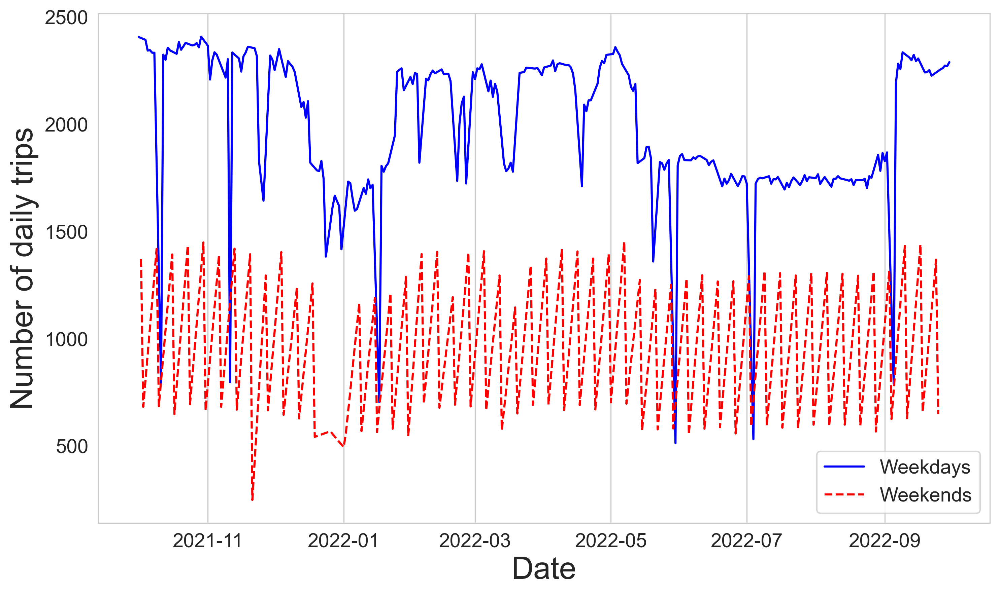

In [144]:
# Group by Date and get the unique TripKeys for each day
unique_trip_counts_per_day = df.groupby('Date')['TripKey'].nunique()

# Convert the index to datetime format and get the day of the week for each date
unique_trip_counts_per_day.index = pd.to_datetime(unique_trip_counts_per_day.index)
day_of_week = unique_trip_counts_per_day.index.dayofweek

# Define weekdays and weekends
weekdays = unique_trip_counts_per_day[(day_of_week >= 0) & (day_of_week <= 4)]
weekends = unique_trip_counts_per_day[(day_of_week >= 5) & (day_of_week <= 6)]

# Plotting
plt.figure(figsize=(10, 6), dpi=300)
plt.plot(weekdays.index, weekdays.values, label='Weekdays', color='blue')
plt.plot(weekends.index, weekends.values, label='Weekends', color='red', linestyle='--')

# Labeling and setting up the plot
plt.xlabel('Date', fontsize=22)
plt.ylabel('Number of daily trips', fontsize=22)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y')
plt.legend(fontsize=14)
plt.tight_layout()
plt.show()


In [87]:
unique_dates = df.loc[df['Route'] == 'B9', 'Date'].unique()
len(unique_dates)

142

In [88]:
df.columns

Index(['Unnamed: 0.4', 'Unnamed: 0.3', 'Unnamed: 0.2', 'Unnamed: 0.1',
       'Unnamed: 0', 'ServiceDateTime', 'DateKey', 'CalendarDate', 'Year',
       'Month', 'OpKey', 'Operator', 'RtKey', 'RtKey2', 'Route', 'RouteName',
       'TripKey', 'Trip', 'StopKey', 'Stop', 'StopName', 'Vehicle',
       'VehicleType', 'SeatedCap', 'TotalCap', 'Lat', 'Lon', 'Boards',
       'Alights', 'Onboard', 'Bike', 'Daytype', 'Hour', 'Minute', 'Second',
       'Date', 'Powertrain', 'VehicleModel', 'Vehicle_mass',
       'time_delta_in_seconds', 'dist', 'Speed', 'Acceleration', 'elevation',
       'grade', 'Energy', 'DayOfWeek'],
      dtype='object')

In [90]:
# Step 1 & 2: Aggregate df by Route and Date to compute average Onboard per route per day
agg_df = df.groupby(['Route', 'Date']).agg({'Onboard': 'mean'}).reset_index()

# Now, to get the average Onboard for each route across all dates:
route_avg_onboard = agg_df.groupby('Route').agg({'Onboard': 'mean'})

# Displaying route 36's metrics vs. all others:
print(route_avg_onboard.loc['36'])
print(route_avg_onboard)

Onboard    2.152163
Name: 36, dtype: float64
         Onboard
Route           
30      7.070382
31      8.250887
33      5.190077
34      4.458860
35      7.306889
36      2.152163
38      4.586530
39E     3.134891
45      2.470806
46      2.109625
801    11.846641
802    15.422537
803    15.734276
804    15.485509
805    11.157662
806     6.774574
820     6.045743
821    16.322750
823     5.292396
824     4.495471
890     0.292206
892    15.609844
902     2.718350
921     7.212424
943     8.574540
9999    3.218748
B12     4.419263
B17     4.474183
B23     3.589450
B4      3.163004
B43    10.053501
B48     6.622288
B6      7.793126
B7     12.364532
B79     0.816572
B9      1.142134
G1      8.269028
G2      7.539708
G3      4.200966
G5      3.112703
G73     7.899484
P11     3.528374
P20    11.294040
P21     8.939875
R10     5.251471
R14     3.301881
R24     3.336994
R29     4.835993
R41     5.018828
R42     4.544157
R44     2.525912
X90     2.967431
X92     3.969519


In [92]:
# Step 1 & 2: Aggregate df by Route and Date to compute average Onboard per route per day
agg_df = df.groupby(['Route', 'Date']).agg({'dist': 'mean'}).reset_index()

# Now, to get the average Onboard for each route across all dates:
route_avg_dist= agg_df.groupby('Route').agg({'dist': 'mean'})

# Displaying route 36's metrics vs. all others:
print(route_avg_dist.loc['36'])
print(route_avg_dist)

dist    0.186946
Name: 36, dtype: float64
           dist
Route          
30     0.225140
31     0.260897
33     0.185299
34     0.153800
35     0.154299
36     0.186946
38     0.257403
39E    0.573599
45     0.323953
46     0.432501
801    0.152995
802    0.159589
803    0.166086
804    0.171335
805    0.150323
806    0.195550
820    0.364574
821    0.174776
823    0.482832
824    0.303370
890    0.558498
892    0.149430
902    0.704968
921    0.307244
943    0.732836
9999   1.506059
B12    1.292645
B17    0.175275
B23    0.402226
B4     0.132865
B43    0.313121
B48    0.484736
B6     0.173167
B7     0.198850
B79    4.725704
B9     0.402338
G1     0.149043
G2     0.158279
G3     0.131881
G5     0.137626
G73    1.178664
P11    0.444059
P20    0.145622
P21    0.119634
R10    0.335293
R14    0.254936
R24    0.149475
R29    0.294085
R41    0.451139
R42    0.618704
R44    0.253652
X90    0.153732
X92    0.146131


In [102]:
unique_elevation = df[['elevation','Stop','StopName']][df['Route'] == '36'].drop_duplicates()
print(unique_elevation)

          elevation  Stop         StopName
12407916      115.0    41  Tilson Farm (I)
12407917      111.0    44       Sylvan (I)
12407918       74.0    46   Totman Gym (I)
12407919       79.0    58              PSB
12407920       75.0    64              ILC
12407921       82.0    71    Fine Arts Ctr
12407922       94.0    82   Fearing St (O)
12407923       97.0    93      Pray St (O)
12407924       95.0    95      Cowles Lane
12407925      100.0   113   Amh Common (S)
12407926       83.0   132  Memorial Dr (O)
12407927       53.0   184   Pomeroy Ln (O)
12407928       64.0   222   Potwine Ln (O)
12407929       87.0   255    Atkins/Bay Rd
12407930        0.0  2087      Atkins Farm
12407931       64.0   221   Potwine Ln (I)
12407932       53.0   179   Pomeroy Ln (I)
12407933       53.0   166  Crocker Frm (I)
12407934       50.0   145      Mill Ln (I)
12407935       68.0   133  Memorial Dr (I)
12407936      100.0   112   Amh Common (N)
12407937       95.0    96  Amh Post Office
12407938   

In [103]:
unique_elevation = df[['elevation','Stop','StopName']][df['Route'] == 'B79'].drop_duplicates()
print(unique_elevation)

          elevation  Stop         StopName
12373286       78.0    73      Haigis Mall
12373287      100.0   113   Amh Common (S)
12373288      156.0   278    Quabbin Shops
12373289      188.0   294  Belchertown Ctr
12373290        0.0   331   Ware Town Hall
12373291        0.0  7902  West Brookfield
12373292        0.0  7904   Brookfield (E)
12373293        0.0  7906  East Brookfield
12373294        0.0  7908      Spencer (E)
12373295        0.0  7910    Leicester (E)
12373296        0.0  7912  Union Station G
12373298        0.0  7911    Leicester (W)
12373299        0.0  7909      Spencer (W)
12373300        0.0  7907  East Brookfield
12373301        0.0  7905   Brookfield (W)
12373302        0.0  7903  West Brookfield
12373303        0.0   332   Ware Town Hall
12373304      155.0   276     Crown Pointe
12373325      100.0   112   Amh Common (N)


In [106]:
df['RouteName'][df['Route'] == 'B79']

12373286    Amherst-Worcester Intercity Service
12373287    Amherst-Worcester Intercity Service
12373288    Amherst-Worcester Intercity Service
12373289    Amherst-Worcester Intercity Service
12373290    Amherst-Worcester Intercity Service
                           ...                 
12428577    Amherst-Worcester Intercity Service
12428578    Amherst-Worcester Intercity Service
12428579    Amherst-Worcester Intercity Service
12428580    Amherst-Worcester Intercity Service
12428581    Amherst-Worcester Intercity Service
Name: RouteName, Length: 563, dtype: object

In [105]:
df.columns

Index(['Unnamed: 0.4', 'Unnamed: 0.3', 'Unnamed: 0.2', 'Unnamed: 0.1',
       'Unnamed: 0', 'ServiceDateTime', 'DateKey', 'CalendarDate', 'Year',
       'Month', 'OpKey', 'Operator', 'RtKey', 'RtKey2', 'Route', 'RouteName',
       'TripKey', 'Trip', 'StopKey', 'Stop', 'StopName', 'Vehicle',
       'VehicleType', 'SeatedCap', 'TotalCap', 'Lat', 'Lon', 'Boards',
       'Alights', 'Onboard', 'Bike', 'Daytype', 'Hour', 'Minute', 'Second',
       'Date', 'Powertrain', 'VehicleModel', 'Vehicle_mass',
       'time_delta_in_seconds', 'dist', 'Speed', 'Acceleration', 'elevation',
       'grade', 'Energy', 'DayOfWeek'],
      dtype='object')